# 2D non-rigid, bond clouds — WS₂

**After affine.** The same pair through affine, then non-rigid at one, two and
three knots per scanline. Each page is A-site fitted and its six
nearest-neighbor bond vectors collected.

## Strategy

1. **One page per correction stage** — raw 0°, raw 90°, affine, then
   non-rigid at K = 1, 2, 3.
2. **Fit every page identically** — the same fixed disk, then the same
   adaptive re-fit, so the only variable is the correction.
3. **Judge with the bond scatter** — sigma_RMS over the six bond directions.


Static rendering is used here so the figures are visible without running
the notebook. Set `INTERACTIVE = True` in the device cell for linked
widget viewing.

## Environment

Install the reviewed paper API and latest published `quantem.widget` release
candidate. One notebook supports both interactive and static/report output:

```bash
python -m pip install --upgrade \
  "git+https://github.com/bobleesj/quantem.git@drift-paper"
python -m pip install --pre --upgrade \
  --index-url https://test.pypi.org/simple \
  --extra-index-url https://pypi.org/simple quantem.widget
```

## Data

Download the [raw WS₂ 0070/0071 data](https://drive.google.com/drive/folders/1boOS-dTl9gnW9CbfA7BKLy5fDJ5cXpkx)
and place the files in `tutorials/imaging/drift/data/robustness/wmill_ws2/`.
The pair is 2048² and is used at full resolution.

## Device and paths

In [1]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

from pathlib import Path

import matplotlib
import numpy as np
import quantem.widget as qw

from quantem.imaging import DriftCorrection
from quantem.imaging.a_sites import (bond_statistics, fit_a_sites,
                                     refit_adaptive)
from quantem.imaging.drift.io import read_emd

DATA = Path("data/robustness/wmill_ws2")

PX_NM = float(read_emd(
    DATA / "0070 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd"
).sampling[0])
H, W = 1972, 1952
ORDER = ["raw 0$\\degree$", "raw 90$\\degree$", "affine",
         "non-rigid, 1 knot", "non-rigid, 2 knots", "non-rigid, 3 knots"]
pages = {}

# Interactive is the recommended default. False uses static/report rendering.
INTERACTIVE = False

matplotlib.rcParams["figure.dpi"] = 100

qw.profile()

quantem.widget  0.0.1rc37
  install       published package
quantem.gpu     0.0.1rc7
  install       published package
quantem         0.1.9
torch           2.14.0+cu130  device=cuda (NVIDIA RTX PRO 6000)
GPUs            1 visible (CUDA_VISIBLE_DEVICES=3)
  GPU0            1.8 used / 102 GB  (100 free)
  torch pool    0.0 live / 0.0 reserved GB
python          3.12.11


## Load and affine

`from_emd` reads scan rotation from Velox metadata — do not hardcode angles.
`lowpass` is the real-space Gaussian sigma in pixels. `ramp` and
`cost_taper` are a separate edge-softening width, also in pixels.

In [2]:
drift = DriftCorrection.from_emd(
    DATA / "0070 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    DATA / "0071 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    verbose=False,
)
drift.preprocess(
    num_knots=1,
    padding_fraction=0.25,
    padding_value="median",
    smoothing_sigma=0.5,
    normalize=True,
    show_combined=False,
    show_knots=False,
    verbose=False,
)

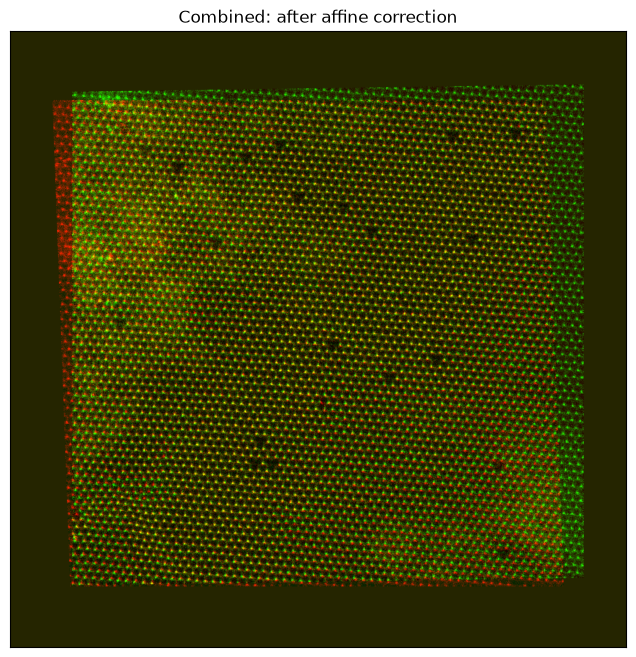

In [3]:
drift.correct_affine(
    max_drift_rate=0.075,
    num_rates=11,
    refine=True,
    refine_divisor=5,
    lowpass=10.0,
    cost_taper=64,
    subpixel="parabola",
    chunk_size=8,
    max_image_shift=512.0,
    show_combined=True,
    show_knots=False,
    verbose=False,
)

## Check affine — `plot_combined`

Confirm yellow registration before spending time on non-rigid.

(<Figure size 1600x800 with 2 Axes>,
 array([<Axes: title={'center': 'Combined: raw (RGB)'}>,
        <Axes: title={'center': 'Combined: after affine correction (RGB)'}>],
       dtype=object))

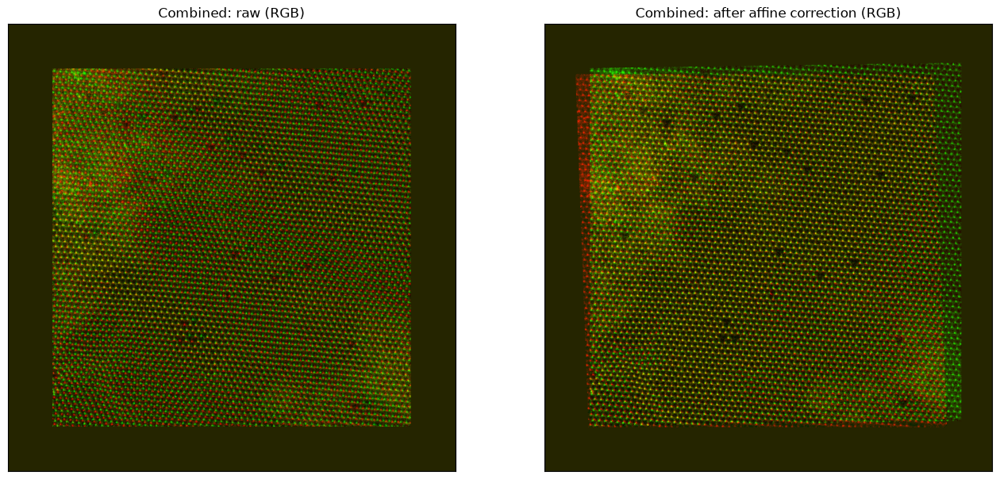

In [4]:
drift.plot_combined(
    stage=("initial", "affine"),  # before | after affine
    interactive=INTERACTIVE,      # linked widget | static Matplotlib
    width=620,                    # panel width px — 400 | 620 | 900
)

## The raw and affine pages

`stage="initial"` re-renders the uncorrected scans from the same object, so
the raw pages land on the common canvas. The affine page is taken from the
current knots, not `stage="affine"`: that snapshot is written at the end of
`correct_affine` and does not include the translation alignment that follows
it.

In [5]:
scans = drift.corrected(
    stage="initial",
    output_frame="canvas",
    merge=False,
    verbose=False,
)
pages[ORDER[0]] = np.asarray(scans[0].array, float)
pages[ORDER[1]] = np.asarray(scans[1].array, float)

pages[ORDER[2]] = np.asarray(drift.corrected(
    upsample_factor=1,
    smoothing_sigma=0.5,
    output_frame="canvas",
    merge=True,
    verbose=False,
).array, float)

## Non-rigid, one knot

Each knot count is solved from scratch: its own `preprocess(num_knots=K)`,
its own affine, then the non-rigid solve at that density.


In [6]:
drift_1 = DriftCorrection.from_emd(
    DATA / "0070 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    DATA / "0071 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    verbose=False,
)
drift_1.preprocess(
    num_knots=1,
    padding_fraction=0.25,
    padding_value="median",
    smoothing_sigma=0.5,
    normalize=True,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_1.correct_affine(
    max_drift_rate=0.075,
    num_rates=11,
    refine=True,
    refine_divisor=5,
    lowpass=10.0,
    cost_taper=64,
    subpixel="parabola",
    chunk_size=8,
    max_image_shift=512.0,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_1.correct_nonrigid(
    num_knots=1,
    optimizer="adam",
    num_refine_cycles=128,
    optimizer_steps=30,
    learning_rate=0.1,
    knot_smoothing_sigma=8.0,
    trend_order=1,
    update_fraction=0.8,
    max_image_shift=32.0,
    show_combined=False,
    show_scans=False,
    show_knots=False,
    show_knot_plot=False,
    show_report=False,
    verbose=True,
)
drift_1.align_translation(
    max_image_shift="wrap",
    lowpass=10.0,
    ramp=64,
    subpixel="parabola",
    show_combined=False,
    show_knots=False,
    verbose=False,
)
pages[ORDER[3]] = np.asarray(drift_1.corrected(
    upsample_factor=1,
    smoothing_sigma=0.5,
    output_frame="canvas",
    merge=True,
    verbose=False,
).array, float)

Solving nonrigid drift (adam):   0%|          | 0/128 [00:00<?, ?it/s]

Solving nonrigid drift (adam):   0%|          | 0/128 [00:01<?, ?it/s, error=0.01438, best=0.01438]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:01<02:26,  1.15s/it, error=0.01438, best=0.01438]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:01<02:26,  1.15s/it, error=0.01421, best=0.01421]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:01<02:26,  1.15s/it, error=0.01401, best=0.01401]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:01<02:26,  1.15s/it, error=0.01391, best=0.01391]

Solving nonrigid drift (adam):   3%|▎         | 4/128 [00:01<00:31,  4.00it/s, error=0.01391, best=0.01391]

Solving nonrigid drift (adam):   3%|▎         | 4/128 [00:01<00:31,  4.00it/s, error=0.01377, best=0.01377]

Solving nonrigid drift (adam):   3%|▎         | 4/128 [00:01<00:31,  4.00it/s, error=0.01372, best=0.01372]

Solving nonrigid drift (adam):   3%|▎         | 4/128 [00:01<00:31,  4.00it/s, error=0.01364, best=0.01364]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:16,  7.30it/s, error=0.01364, best=0.01364]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:16,  7.30it/s, error=0.01357, best=0.01357]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:16,  7.30it/s, error=0.0135, best=0.0135]  

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:16,  7.30it/s, error=0.01343, best=0.01343]

Solving nonrigid drift (adam):   8%|▊         | 10/128 [00:01<00:11, 10.57it/s, error=0.01343, best=0.01343]

Solving nonrigid drift (adam):   8%|▊         | 10/128 [00:01<00:11, 10.57it/s, error=0.01338, best=0.01338]

Solving nonrigid drift (adam):   8%|▊         | 10/128 [00:01<00:11, 10.57it/s, error=0.01332, best=0.01332]

Solving nonrigid drift (adam):   8%|▊         | 10/128 [00:01<00:11, 10.57it/s, error=0.01326, best=0.01326]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:08, 13.61it/s, error=0.01326, best=0.01326]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:08, 13.61it/s, error=0.01323, best=0.01323]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:08, 13.61it/s, error=0.0132, best=0.0132]  

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:08, 13.61it/s, error=0.01316, best=0.01316]

Solving nonrigid drift (adam):  12%|█▎        | 16/128 [00:01<00:06, 16.29it/s, error=0.01316, best=0.01316]

Solving nonrigid drift (adam):  12%|█▎        | 16/128 [00:01<00:06, 16.29it/s, error=0.01313, best=0.01313]

Solving nonrigid drift (adam):  12%|█▎        | 16/128 [00:01<00:06, 16.29it/s, error=0.01309, best=0.01309]

Solving nonrigid drift (adam):  12%|█▎        | 16/128 [00:01<00:06, 16.29it/s, error=0.01307, best=0.01307]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:05, 18.54it/s, error=0.01307, best=0.01307]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:05, 18.54it/s, error=0.01305, best=0.01305]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:05, 18.54it/s, error=0.01302, best=0.01302]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:05, 18.54it/s, error=0.013, best=0.013]    

Solving nonrigid drift (adam):  17%|█▋        | 22/128 [00:01<00:05, 20.34it/s, error=0.013, best=0.013]

Solving nonrigid drift (adam):  17%|█▋        | 22/128 [00:02<00:05, 20.34it/s, error=0.01298, best=0.01298]

Solving nonrigid drift (adam):  17%|█▋        | 22/128 [00:02<00:05, 20.34it/s, error=0.01296, best=0.01296]

Solving nonrigid drift (adam):  17%|█▋        | 22/128 [00:02<00:05, 20.34it/s, error=0.01293, best=0.01293]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:04, 21.73it/s, error=0.01293, best=0.01293]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:04, 21.73it/s, error=0.01292, best=0.01292]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:04, 21.73it/s, error=0.01289, best=0.01289]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:04, 21.73it/s, error=0.01287, best=0.01287]

Solving nonrigid drift (adam):  22%|██▏       | 28/128 [00:02<00:04, 22.77it/s, error=0.01287, best=0.01287]

Solving nonrigid drift (adam):  22%|██▏       | 28/128 [00:02<00:04, 22.77it/s, error=0.01286, best=0.01286]

Solving nonrigid drift (adam):  22%|██▏       | 28/128 [00:02<00:04, 22.77it/s, error=0.01283, best=0.01283]

Solving nonrigid drift (adam):  22%|██▏       | 28/128 [00:02<00:04, 22.77it/s, error=0.01281, best=0.01281]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:04, 23.54it/s, error=0.01281, best=0.01281]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:04, 23.54it/s, error=0.0128, best=0.0128]  

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:04, 23.54it/s, error=0.01277, best=0.01277]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:04, 23.54it/s, error=0.01277, best=0.01277]

Solving nonrigid drift (adam):  27%|██▋       | 34/128 [00:02<00:03, 24.10it/s, error=0.01277, best=0.01277]

Solving nonrigid drift (adam):  27%|██▋       | 34/128 [00:02<00:03, 24.10it/s, error=0.01275, best=0.01275]

Solving nonrigid drift (adam):  27%|██▋       | 34/128 [00:02<00:03, 24.10it/s, error=0.01274, best=0.01274]

Solving nonrigid drift (adam):  27%|██▋       | 34/128 [00:02<00:03, 24.10it/s, error=0.01273, best=0.01273]

Solving nonrigid drift (adam):  29%|██▉       | 37/128 [00:02<00:03, 24.51it/s, error=0.01273, best=0.01273]

Solving nonrigid drift (adam):  29%|██▉       | 37/128 [00:02<00:03, 24.51it/s, error=0.01273, best=0.01273]

Solving nonrigid drift (adam):  29%|██▉       | 37/128 [00:02<00:03, 24.51it/s, error=0.01272, best=0.01272]

Solving nonrigid drift (adam):  29%|██▉       | 37/128 [00:02<00:03, 24.51it/s, error=0.01272, best=0.01272]

Solving nonrigid drift (adam):  31%|███▏      | 40/128 [00:02<00:03, 24.80it/s, error=0.01272, best=0.01272]

Solving nonrigid drift (adam):  31%|███▏      | 40/128 [00:02<00:03, 24.80it/s, error=0.01271, best=0.01271]

Solving nonrigid drift (adam):  31%|███▏      | 40/128 [00:02<00:03, 24.80it/s, error=0.01269, best=0.01269]

Solving nonrigid drift (adam):  31%|███▏      | 40/128 [00:02<00:03, 24.80it/s, error=0.01269, best=0.01269]

Solving nonrigid drift (adam):  34%|███▎      | 43/128 [00:02<00:03, 25.01it/s, error=0.01269, best=0.01269]

Solving nonrigid drift (adam):  34%|███▎      | 43/128 [00:02<00:03, 25.01it/s, error=0.01268, best=0.01268]

Solving nonrigid drift (adam):  34%|███▎      | 43/128 [00:02<00:03, 25.01it/s, error=0.01267, best=0.01267]

Solving nonrigid drift (adam):  34%|███▎      | 43/128 [00:02<00:03, 25.01it/s, error=0.01266, best=0.01266]

Solving nonrigid drift (adam):  36%|███▌      | 46/128 [00:02<00:03, 25.16it/s, error=0.01266, best=0.01266]

Solving nonrigid drift (adam):  36%|███▌      | 46/128 [00:02<00:03, 25.16it/s, error=0.01265, best=0.01265]

Solving nonrigid drift (adam):  36%|███▌      | 46/128 [00:02<00:03, 25.16it/s, error=0.01265, best=0.01265]

Solving nonrigid drift (adam):  36%|███▌      | 46/128 [00:03<00:03, 25.16it/s, error=0.01264, best=0.01264]

Solving nonrigid drift (adam):  38%|███▊      | 49/128 [00:03<00:03, 25.27it/s, error=0.01264, best=0.01264]

Solving nonrigid drift (adam):  38%|███▊      | 49/128 [00:03<00:03, 25.27it/s, error=0.01265, best=0.01264]

Solving nonrigid drift (adam):  38%|███▊      | 49/128 [00:03<00:03, 25.27it/s, error=0.01264, best=0.01264]

Solving nonrigid drift (adam):  38%|███▊      | 49/128 [00:03<00:03, 25.27it/s, error=0.01265, best=0.01264]

Solving nonrigid drift (adam):  41%|████      | 52/128 [00:03<00:02, 25.34it/s, error=0.01265, best=0.01264]

Solving nonrigid drift (adam):  41%|████      | 52/128 [00:03<00:02, 25.34it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  41%|████      | 52/128 [00:03<00:02, 25.34it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  41%|████      | 52/128 [00:03<00:02, 25.34it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  43%|████▎     | 55/128 [00:03<00:02, 25.40it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  43%|████▎     | 55/128 [00:03<00:02, 25.40it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  43%|████▎     | 55/128 [00:03<00:02, 25.40it/s, error=0.01263, best=0.01263]

Solving nonrigid drift (adam):  43%|████▎     | 55/128 [00:03<00:02, 25.40it/s, error=0.01262, best=0.01262]

Solving nonrigid drift (adam):  45%|████▌     | 58/128 [00:03<00:02, 25.44it/s, error=0.01262, best=0.01262]

Solving nonrigid drift (adam):  45%|████▌     | 58/128 [00:03<00:02, 25.44it/s, error=0.01262, best=0.01262]

Solving nonrigid drift (adam):  45%|████▌     | 58/128 [00:03<00:02, 25.44it/s, error=0.01261, best=0.01261]

Solving nonrigid drift (adam):  45%|████▌     | 58/128 [00:03<00:02, 25.44it/s, error=0.0126, best=0.0126]  

Solving nonrigid drift (adam):  48%|████▊     | 61/128 [00:03<00:02, 25.46it/s, error=0.0126, best=0.0126]

Solving nonrigid drift (adam):  48%|████▊     | 61/128 [00:03<00:02, 25.46it/s, error=0.0126, best=0.0126]

Solving nonrigid drift (adam):  48%|████▊     | 61/128 [00:03<00:02, 25.46it/s, error=0.0126, best=0.0126]

Solving nonrigid drift (adam):  48%|████▊     | 61/128 [00:03<00:02, 25.46it/s, error=0.01259, best=0.01259]

Solving nonrigid drift (adam):  50%|█████     | 64/128 [00:03<00:02, 25.47it/s, error=0.01259, best=0.01259]

Solving nonrigid drift (adam):  50%|█████     | 64/128 [00:03<00:02, 25.47it/s, error=0.01258, best=0.01258]

Solving nonrigid drift (adam):  50%|█████     | 64/128 [00:03<00:02, 25.47it/s, error=0.01257, best=0.01257]

Solving nonrigid drift (adam):  50%|█████     | 64/128 [00:03<00:02, 25.47it/s, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  52%|█████▏    | 67/128 [00:03<00:02, 25.49it/s, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  52%|█████▏    | 67/128 [00:03<00:02, 25.49it/s, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  52%|█████▏    | 67/128 [00:03<00:02, 25.49it/s, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  52%|█████▏    | 67/128 [00:03<00:02, 25.49it/s, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  52%|█████▏    | 67/128 [00:03<00:02, 25.49it/s, converged at cycle 70, error=0.01256, best=0.01256]

Solving nonrigid drift (adam):  54%|█████▍    | 69/128 [00:03<00:03, 17.87it/s, converged at cycle 70, error=0.01256, best=0.01256]

## Check non-rigid, one knot — `plot_combined`

Three stages side by side. Look for yellow tighten vs affine **without**
lattice hop or zipper.

(<Figure size 2400x800 with 3 Axes>,
 array([<Axes: title={'center': 'Combined: raw (RGB)'}>,
        <Axes: title={'center': 'Combined: after affine correction (RGB)'}>,
        <Axes: title={'center': 'Combined: after non-rigid correction (RGB)'}>],
       dtype=object))

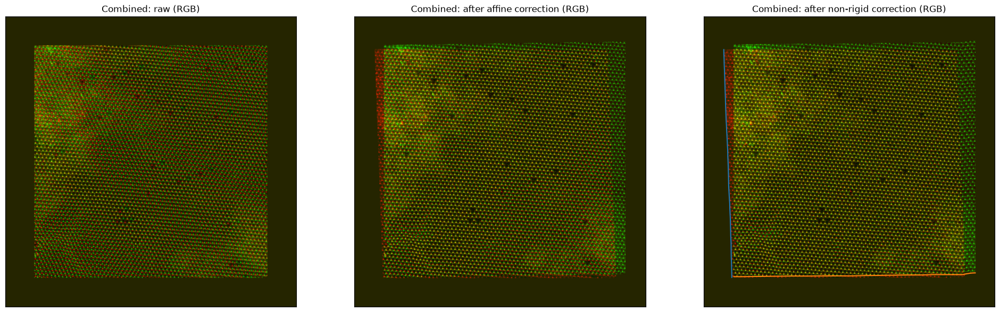

In [7]:
drift_1.plot_combined(
    stage=("initial", "affine", "nonrigid"),
    interactive=INTERACTIVE,      # linked widget | static Matplotlib
    width=620,
    # show_fft=False,
    # zoom=1.0,
    # center=(0.0, 0.0),
)

## Non-rigid, two knots

In [8]:
drift_2 = DriftCorrection.from_emd(
    DATA / "0070 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    DATA / "0071 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    verbose=False,
)
drift_2.preprocess(
    num_knots=2,
    padding_fraction=0.25,
    padding_value="median",
    smoothing_sigma=0.5,
    normalize=True,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_2.correct_affine(
    max_drift_rate=0.075,
    num_rates=11,
    refine=True,
    refine_divisor=5,
    lowpass=10.0,
    cost_taper=64,
    subpixel="parabola",
    chunk_size=8,
    max_image_shift=512.0,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_2.correct_nonrigid(
    num_knots=2,
    optimizer="adam",
    num_refine_cycles=128,
    optimizer_steps=30,
    learning_rate=0.1,
    knot_smoothing_sigma=8.0,
    trend_order=1,
    update_fraction=0.8,
    max_image_shift=32.0,
    show_combined=False,
    show_scans=False,
    show_knots=False,
    show_knot_plot=False,
    show_report=False,
    verbose=True,
)
drift_2.align_translation(
    max_image_shift="wrap",
    lowpass=10.0,
    ramp=64,
    subpixel="parabola",
    show_combined=False,
    show_knots=False,
    verbose=False,
)
pages[ORDER[4]] = np.asarray(drift_2.corrected(
    upsample_factor=1,
    smoothing_sigma=0.5,
    output_frame="canvas",
    merge=True,
    verbose=False,
).array, float)

Solving nonrigid drift (adam):   0%|          | 0/128 [00:00<?, ?it/s]

Solving nonrigid drift (adam):   0%|          | 0/128 [00:00<?, ?it/s, error=0.01411, best=0.01411]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:00,  2.08it/s, error=0.01411, best=0.01411]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:00,  2.08it/s, error=0.01357, best=0.01357]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:00,  2.08it/s, error=0.01307, best=0.01307]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.38it/s, error=0.01307, best=0.01307]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.38it/s, error=0.01267, best=0.01267]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.38it/s, error=0.0125, best=0.0125]  

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.53it/s, error=0.0125, best=0.0125]

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.53it/s, error=0.0124, best=0.0124]

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.53it/s, error=0.01235, best=0.01235]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:00<00:13,  8.95it/s, error=0.01235, best=0.01235]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:13,  8.95it/s, error=0.01233, best=0.01233]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:13,  8.95it/s, error=0.01231, best=0.01231]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:12,  9.91it/s, error=0.01231, best=0.01231]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:12,  9.91it/s, error=0.01231, best=0.01231]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:12,  9.91it/s, error=0.01231, best=0.01231]

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:11, 10.58it/s, error=0.01231, best=0.01231]

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:11, 10.58it/s, error=0.0123, best=0.0123]  

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:11, 10.58it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:10, 11.03it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:10, 11.03it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:10, 11.03it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 11.35it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 11.35it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 11.35it/s, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 11.35it/s, converged at cycle 17, error=0.0123, best=0.0123]

Solving nonrigid drift (adam):  12%|█▎        | 16/128 [00:01<00:12,  8.86it/s, converged at cycle 17, error=0.0123, best=0.0123]

## Check non-rigid, two knots — `plot_combined`

Three stages side by side. Look for yellow tighten vs affine **without**
lattice hop or zipper.

(<Figure size 2400x800 with 3 Axes>,
 array([<Axes: title={'center': 'Combined: raw (RGB)'}>,
        <Axes: title={'center': 'Combined: after affine correction (RGB)'}>,
        <Axes: title={'center': 'Combined: after non-rigid correction (RGB)'}>],
       dtype=object))

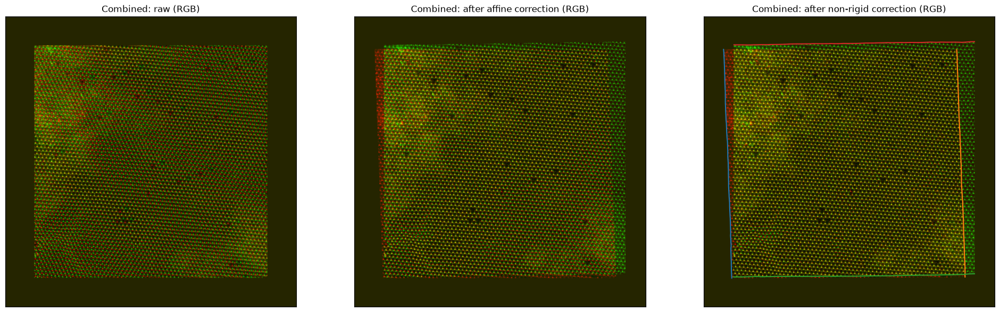

In [9]:
drift_2.plot_combined(
    stage=("initial", "affine", "nonrigid"),
    interactive=INTERACTIVE,      # linked widget | static Matplotlib
    width=620,
    # show_fft=False,
    # zoom=1.0,
    # center=(0.0, 0.0),
)

## Non-rigid, three knots

In [10]:
drift_3 = DriftCorrection.from_emd(
    DATA / "0070 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    DATA / "0071 - VWS2_9h_g_300kv STEM HAADF 5.20 Mx Diffraction.emd",
    verbose=False,
)
drift_3.preprocess(
    num_knots=3,
    padding_fraction=0.25,
    padding_value="median",
    smoothing_sigma=0.5,
    normalize=True,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_3.correct_affine(
    max_drift_rate=0.075,
    num_rates=11,
    refine=True,
    refine_divisor=5,
    lowpass=10.0,
    cost_taper=64,
    subpixel="parabola",
    chunk_size=8,
    max_image_shift=512.0,
    show_combined=False,
    show_knots=False,
    verbose=False,
)
drift_3.correct_nonrigid(
    num_knots=3,
    optimizer="adam",
    num_refine_cycles=128,
    optimizer_steps=30,
    learning_rate=0.1,
    knot_smoothing_sigma=8.0,
    trend_order=1,
    update_fraction=0.8,
    max_image_shift=32.0,
    show_combined=False,
    show_scans=False,
    show_knots=False,
    show_knot_plot=False,
    show_report=False,
    verbose=True,
)
drift_3.align_translation(
    max_image_shift="wrap",
    lowpass=10.0,
    ramp=64,
    subpixel="parabola",
    show_combined=False,
    show_knots=False,
    verbose=False,
)
pages[ORDER[5]] = np.asarray(drift_3.corrected(
    upsample_factor=1,
    smoothing_sigma=0.5,
    output_frame="canvas",
    merge=True,
    verbose=False,
).array, float)

Solving nonrigid drift (adam):   0%|          | 0/128 [00:00<?, ?it/s]

Solving nonrigid drift (adam):   0%|          | 0/128 [00:00<?, ?it/s, error=0.01395, best=0.01395]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:04,  1.97it/s, error=0.01395, best=0.01395]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:04,  1.97it/s, error=0.01324, best=0.01324]

Solving nonrigid drift (adam):   1%|          | 1/128 [00:00<01:04,  1.97it/s, error=0.01277, best=0.01277]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.31it/s, error=0.01277, best=0.01277]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.31it/s, error=0.01255, best=0.01255]

Solving nonrigid drift (adam):   2%|▏         | 3/128 [00:00<00:23,  5.31it/s, error=0.01241, best=0.01241]

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.62it/s, error=0.01241, best=0.01241]

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.62it/s, error=0.01233, best=0.01233]

Solving nonrigid drift (adam):   4%|▍         | 5/128 [00:00<00:16,  7.62it/s, error=0.01227, best=0.01227]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:00<00:13,  9.24it/s, error=0.01227, best=0.01227]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:13,  9.24it/s, error=0.01224, best=0.01224]

Solving nonrigid drift (adam):   5%|▌         | 7/128 [00:01<00:13,  9.24it/s, error=0.01223, best=0.01223]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:11, 10.36it/s, error=0.01223, best=0.01223]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:11, 10.36it/s, error=0.01222, best=0.01222]

Solving nonrigid drift (adam):   7%|▋         | 9/128 [00:01<00:11, 10.36it/s, error=0.01221, best=0.01221]

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:10, 11.14it/s, error=0.01221, best=0.01221]

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:10, 11.14it/s, error=0.0122, best=0.0122]  

Solving nonrigid drift (adam):   9%|▊         | 11/128 [00:01<00:10, 11.14it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:09, 11.69it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:09, 11.69it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  10%|█         | 13/128 [00:01<00:09, 11.69it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 12.08it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 12.08it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  12%|█▏        | 15/128 [00:01<00:09, 12.08it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  13%|█▎        | 17/128 [00:01<00:08, 12.34it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  13%|█▎        | 17/128 [00:01<00:08, 12.34it/s, error=0.0122, best=0.0122]

Solving nonrigid drift (adam):  13%|█▎        | 17/128 [00:01<00:08, 12.34it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:08, 12.54it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:01<00:08, 12.54it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  15%|█▍        | 19/128 [00:02<00:08, 12.54it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  16%|█▋        | 21/128 [00:02<00:08, 12.67it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  16%|█▋        | 21/128 [00:02<00:08, 12.67it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  16%|█▋        | 21/128 [00:02<00:08, 12.67it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  18%|█▊        | 23/128 [00:02<00:08, 12.75it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  18%|█▊        | 23/128 [00:02<00:08, 12.75it/s, error=0.01219, best=0.01219]

Solving nonrigid drift (adam):  18%|█▊        | 23/128 [00:02<00:08, 12.75it/s, error=0.01218, best=0.01219]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:08, 12.82it/s, error=0.01218, best=0.01219]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:08, 12.82it/s, error=0.01218, best=0.01219]

Solving nonrigid drift (adam):  20%|█▉        | 25/128 [00:02<00:08, 12.82it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  21%|██        | 27/128 [00:02<00:07, 12.87it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  21%|██        | 27/128 [00:02<00:07, 12.87it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  21%|██        | 27/128 [00:02<00:07, 12.87it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  23%|██▎       | 29/128 [00:02<00:07, 12.90it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  23%|██▎       | 29/128 [00:02<00:07, 12.90it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  23%|██▎       | 29/128 [00:02<00:07, 12.90it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:07, 12.92it/s, error=0.01218, best=0.01218]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:07, 12.92it/s, error=0.01217, best=0.01217]

Solving nonrigid drift (adam):  24%|██▍       | 31/128 [00:02<00:07, 12.92it/s, error=0.01217, best=0.01217]

Solving nonrigid drift (adam):  26%|██▌       | 33/128 [00:02<00:07, 12.94it/s, error=0.01217, best=0.01217]

Solving nonrigid drift (adam):  26%|██▌       | 33/128 [00:03<00:07, 12.94it/s, error=0.01217, best=0.01217]

Solving nonrigid drift (adam):  26%|██▌       | 33/128 [00:03<00:07, 12.94it/s, error=0.01218, best=0.01217]

Solving nonrigid drift (adam):  27%|██▋       | 35/128 [00:03<00:07, 12.94it/s, error=0.01218, best=0.01217]

Solving nonrigid drift (adam):  27%|██▋       | 35/128 [00:03<00:07, 12.94it/s, error=0.01218, best=0.01217]

Solving nonrigid drift (adam):  27%|██▋       | 35/128 [00:03<00:07, 12.94it/s, converged at cycle 36, error=0.01218, best=0.01217]

Solving nonrigid drift (adam):  27%|██▋       | 35/128 [00:03<00:08, 10.92it/s, converged at cycle 36, error=0.01218, best=0.01217]

## Check non-rigid, three knots — `plot_combined`

Three stages side by side. Look for yellow tighten vs affine **without**
lattice hop or zipper.

(<Figure size 2400x800 with 3 Axes>,
 array([<Axes: title={'center': 'Combined: raw (RGB)'}>,
        <Axes: title={'center': 'Combined: after affine correction (RGB)'}>,
        <Axes: title={'center': 'Combined: after non-rigid correction (RGB)'}>],
       dtype=object))

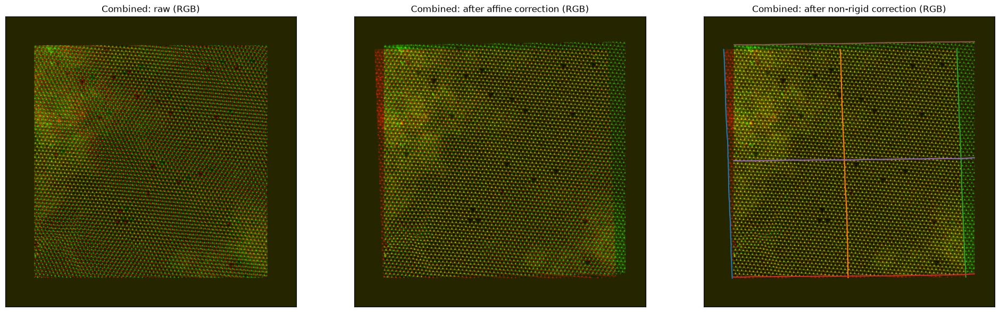

In [11]:
drift_3.plot_combined(
    stage=("initial", "affine", "nonrigid"),
    interactive=INTERACTIVE,      # linked widget | static Matplotlib
    width=620,
    # show_fft=False,
    # zoom=1.0,
    # center=(0.0, 0.0),
)

## Scores — `report()`

Regional NCC on the common-coverage mask, for the three-knot correction still
in memory.

In [12]:
drift_3.report()

,Common NCC,Top third,Middle third,Bottom third,Coverage
Mutual stage,,,,,
before,0.022726,0.017035,0.044997,0.000582,0.95609
affine,0.321898,0.379900,0.363269,0.218643,0.95609
nonrigid,0.575451,0.567413,0.589176,0.566797,0.95609


## Fit the A sites

Each page is cropped to a common `H x W` window centered on its data
footprint, so site counts reflect the correction rather than the area. Then
the fixed-disk fit, then the adaptive re-fit at 4 sigma.

In [13]:
images, fits, stats = {}, {}, {}
for label in ORDER:
    page = pages[label]
    values, counts = np.unique(np.round(page, 6), return_counts=True)
    mask = ~np.isclose(page, values[counts.argmax()], atol=1e-9)
    rows, cols = np.flatnonzero(mask.any(1)), np.flatnonzero(mask.any(0))
    r0 = int(np.clip((rows[0] + rows[-1] + 1 - H) // 2, 0, page.shape[0] - H))
    c0 = int(np.clip((cols[0] + cols[-1] + 1 - W) // 2, 0, page.shape[1] - W))
    images[label] = page[r0:r0 + H, c0:c0 + W]

    fit = fit_a_sites(
        images[label], PX_NM,
        min_spacing_frac=0.70,
        tolerance_uvw=1.3,
        fit_radius_frac=0.40,
        max_move_frac=0.15,
        sigma_min_frac=0.045,
        edge_margin_frac=0.5,
        min_amplitude_frac=0.35,
        max_nfev=200,
    )
    fit = refit_adaptive(
        fit, images[label] / images[label].max(),
        n_sigma=4.0,
        iterations=3,
        verbose=False,
    )
    fits[label], stats[label] = fit, bond_statistics(fit)

## Figure

Everything the published panel needs, in one cell: four rows per page — the
image, the A sites used, the six bond clouds in place with 2-sigma covariance
ellipses magnified 5x, and all six collapsed on the origin with density
contours.

Small variation from the published figure is expected, because the torch
non-rigid stage is not deterministic.

Text(0.5, 0.01, '$\\Delta x$ (pm)   —   ellipses 2$\\sigma$ magnified $\\times$5')

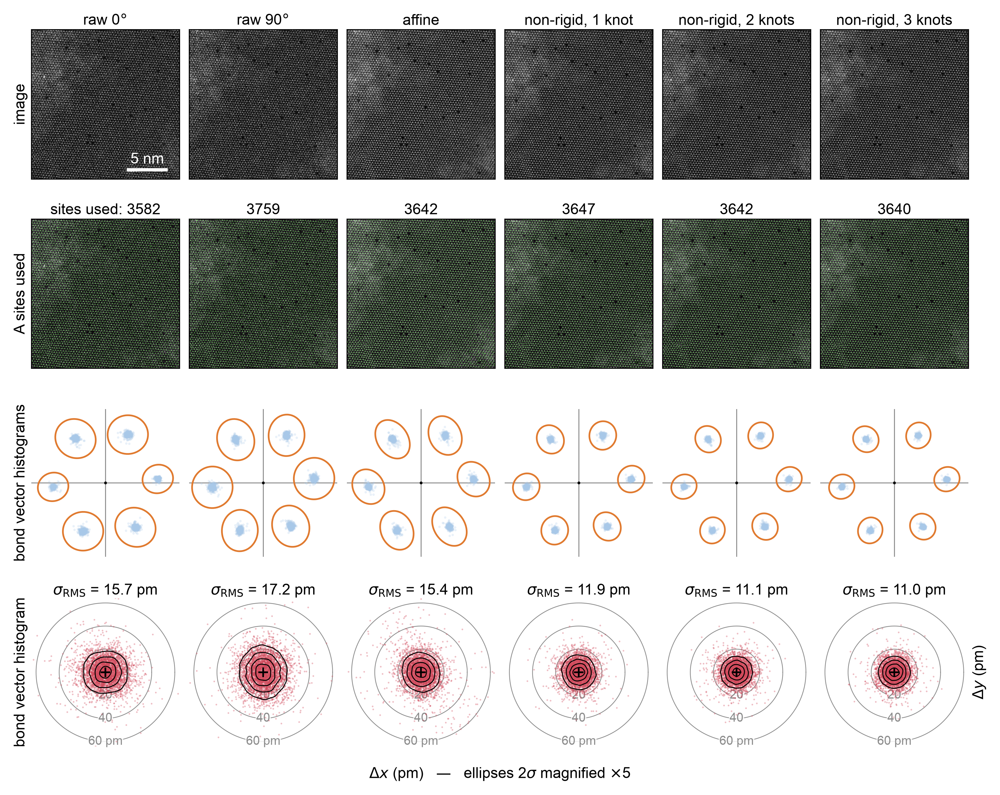

In [14]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib.patches import Ellipse
from scipy.ndimage import gaussian_filter

from quantem.imaging.a_sites import cloud_ellipse, cloud_half_extent

FONT_SIZE = 8.0
COL_DOUBLE = 183.0 / 25.4
rcParams.update({
    "font.size": FONT_SIZE,
    "axes.titlesize": FONT_SIZE,
    "font.sans-serif": ["Arial", "DejaVu Sans"],
    "image.interpolation": "nearest",
})


def plot_bond_clouds(ax, stats, point_size=1.2, point_alpha=0.25,
                     point_color="#a8c8e8", ellipse_color="#e07a2f",
                     extent_pm=None, max_points_per_cloud=400, seed=0,
                     axis_color="0.55"):
    rng = np.random.default_rng(seed)
    for cloud in stats["clouds"]:
        pts = cloud["vectors"]
        if len(pts) > max_points_per_cloud:
            pts = pts[rng.choice(len(pts), max_points_per_cloud, replace=False)]
        ax.scatter(pts[:, 1], pts[:, 0], s=point_size, c=point_color,
                   alpha=point_alpha, linewidths=0, rasterized=True, zorder=2)
        center, (width, height), angle, _, _ = cloud_ellipse(cloud)
        ax.add_patch(Ellipse(center, width, height, angle=angle, fill=False,
                             edgecolor=ellipse_color, lw=0.9, zorder=3))
    limit = 1.5 * stats["mean_length"] if extent_pm is None else extent_pm
    ax.axhline(0, color=axis_color, lw=0.5, zorder=1)
    ax.axvline(0, color=axis_color, lw=0.5, zorder=1)
    ax.plot(0, 0, marker="o", ms=1.5, mew=0, color="k", zorder=5)
    _square(ax, limit)

def plot_deviation(ax, stats, color="#d1495b", radii=(20, 40, 60),
                   max_points=4000, point_size=0.8, point_alpha=0.35,
                   contour_levels=(0.15, 0.35, 0.6, 0.85), extent_pm=None,
                   seed=0, fontsize=None):
    dev = stats["deviations"]
    e = max(radii) * 1.12 if extent_pm is None else extent_pm
    theta = np.linspace(0, 2 * np.pi, 181)
    for r in radii:
        ax.plot(r * np.cos(theta), r * np.sin(theta), color="0.55", lw=0.4,
                zorder=0)
        ax.annotate(f"{r} pm" if r == max(radii) else f"{r}", (0.0, -r),
                    color="0.55", ha="center", va="center", fontsize=fontsize,
                    zorder=1, bbox=dict(boxstyle="square,pad=0.05", fc="w",
                                        ec="none", alpha=0.85))
    rng = np.random.default_rng(seed)
    if len(dev) > max_points:
        show = dev[rng.choice(len(dev), max_points, replace=False)]
    else:
        show = dev
    ax.scatter(show[:, 1], show[:, 0], s=point_size, c=color, alpha=point_alpha,
               linewidths=0, zorder=2, rasterized=True)

    hist, xe, ye = np.histogram2d(dev[:, 1], dev[:, 0], bins=96,
                                  range=[[-e, e], [-e, e]])
    spread = np.sqrt(np.mean(np.var(dev, axis=0)))
    bandwidth = max(1.0, 0.9 * spread * len(dev) ** (-1 / 6) / (2 * e / 96))
    dens = gaussian_filter(hist.T, bandwidth)
    if dens.max() > 0:
        ax.contour(dens / dens.max(), levels=sorted(contour_levels),
                   extent=(xe[0], xe[-1], ye[0], ye[-1]), colors="k",
                   linewidths=0.5, zorder=3)
    ax.plot(0, 0, marker="+", ms=5, mew=0.9, color="k", zorder=4)
    _square(ax, e)
    ax.set_title("$\\sigma_\\mathrm{RMS}$ = "
                 f"{stats['sigma_mean']:.1f} pm", pad=2.0)

def _square(ax, limit):
    ax.set_xlim(-limit, limit)
    ax.set_ylim(-limit, limit)
    ax.set_aspect("equal")
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)


extent = 1.04 * max(cloud_half_extent(st) for st in stats.values())
n = len(ORDER)
fig, axs = plt.subplots(4, n, figsize=(COL_DOUBLE, 4 * COL_DOUBLE / n + 0.90),
                        dpi=450, constrained_layout=True)
fig.get_layout_engine().set(h_pad=0.004, w_pad=0.012, hspace=0.01, wspace=0.06)
msize = 0.30 * (COL_DOUBLE / n) ** 2

for j, label in enumerate(ORDER):
    fit, image = fits[label], images[label]
    low, high = np.quantile(image, (0.02, 0.99))
    good = fit["good"]
    for row in (0, 1):
        axs[row, j].imshow(image, cmap="gray", vmin=low, vmax=high)
        axs[row, j].set_xticks([]); axs[row, j].set_yticks([])
        for spine in axs[row, j].spines.values():
            spine.set_visible(True); spine.set_color("k")
            spine.set_linewidth(0.5)

    axs[1, j].scatter(fit["y"][good], fit["x"][good], s=msize, marker="+",
                      c="#39ff14", linewidths=0.10, alpha=0.85)
    axs[1, j].set_xlim(0, image.shape[1]); axs[1, j].set_ylim(image.shape[0], 0)
    axs[0, j].set_title(label, pad=2.5, fontsize=FONT_SIZE)
    axs[1, j].set_title(f"sites used: {int(good.sum())}" if j == 0
                        else f"{int(good.sum())}", pad=2.5, fontsize=FONT_SIZE)
    plot_bond_clouds(axs[2, j], stats[label], extent_pm=extent, point_size=1.6)
    plot_deviation(axs[3, j], stats[label], radii=(20, 40, 60),
                   extent_pm=64.0,
                   fontsize=FONT_SIZE - 1.5)

bar = 5.0 / PX_NM
x0, x1 = axs[0, 0].get_xlim(); y0, y1 = axs[0, 0].get_ylim()
bx, by = x1 - 0.08 * (x1 - x0) - bar, y0 + 0.05 * (y1 - y0)
axs[0, 0].add_patch(plt.Rectangle((bx, by), bar, 0.022 * (y1 - y0), fc="w",
                                  ec="none", zorder=5))
axs[0, 0].text(bx + bar / 2, by + 0.032 * (y1 - y0), "5 nm", ha="center",
               va="bottom", color="w", zorder=5, fontsize=FONT_SIZE)

axs[3, -1].yaxis.set_label_position("right")
axs[3, -1].set_ylabel("$\\Delta y$ (pm)", labelpad=2, fontsize=FONT_SIZE)
for row, text in zip(range(4), ["image", "A sites used",
                                "bond vector histograms",
                                "bond vector histogram"]):
    axs[row, 0].set_ylabel(text, labelpad=2, fontsize=FONT_SIZE)
fig.supxlabel("$\\Delta x$ (pm)   —   ellipses 2$\\sigma$ magnified $\\times$5",
              fontsize=FONT_SIZE)
# Note: small variation from the published figure is expected, because the
# torch non-rigid stage is not deterministic.